In [2]:
import numpy as np
import matplotlib.pyplot as plt

def smooth(y, radius=60, mode='two_sided'):
    if len(y) < 2*radius+1:
        return np.ones_like(y) * y.mean()
    elif mode == 'two_sided':
        convkernel = np.ones(2 * radius+1)
        return np.convolve(y, convkernel, mode='same') / \
               np.convolve(np.ones_like(y), convkernel, mode='same')
    elif mode == 'causal':
        convkernel = np.ones(radius)
        out = np.convolve(y, convkernel,mode='full') / \
              np.convolve(np.ones_like(y), convkernel, mode='full')
        return out[:-radius+1]


## Nash DQN Results

{0: 48, 1: 55, 2: 38, 3: 34, 4: 50, 5: 55, 6: 58, 7: 45, 8: 47}


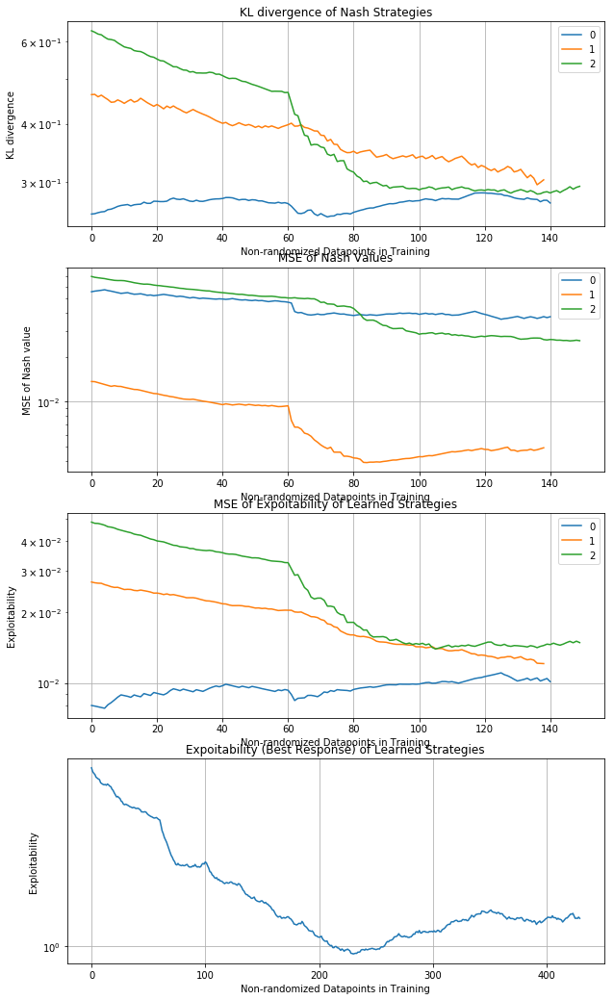

In [28]:
import pickle
def load_obj(path_prefix):
    with open(path_prefix + 'simple_mdp_log_no_target128.pkl', 'rb') as f:
        return pickle.load(f)
path_prefix = '../data/nash_dqn_test/nash_dqn_'
data = load_obj(path_prefix)
# print(data)
fig, axs = plt.subplots(4, figsize=(10,18))

kl = data['kl_nash_dist']
for i, kl4trans in enumerate(kl):
    axs[0].plot(smooth(np.array(kl4trans)), label=i)
axs[0].set_xlabel('Non-randomized Datapoints in Training')
axs[0].set_ylabel('KL divergence')
axs[0].set_yscale('log')
axs[0].legend()
axs[0].grid()
axs[0].set_title('KL divergence of Nash Strategies')
# axs[0].savefig(path_prefix+'kl_dist.pdf')

mse = data['mse_nash_v']
for i, mse4trans in enumerate(mse):
    axs[1].plot(smooth(np.array(mse4trans)), label=i)
axs[1].set_xlabel('Non-randomized Datapoints in Training')
axs[1].set_ylabel('MSE of Nash value')
axs[1].set_yscale('log')
axs[1].legend()
axs[1].grid()
axs[1].set_title('MSE of Nash Values')
# axs[1].savefig(path_prefix+'mse_v.pdf')

exp = data['mse_exploitability']
for i, exp4trans in enumerate(exp):
    axs[2].plot(smooth(np.array(exp4trans)), label=i)
axs[2].set_xlabel('Non-randomized Datapoints in Training')
axs[2].set_ylabel('Exploitability')
axs[2].set_yscale('log')
axs[2].legend()
axs[2].grid()
axs[2].set_title('MSE of Expoitability of Learned Strategies')
# axs[2].savefig(path_prefix+'exp.pdf')

brv = data['brv']
axs[3].plot(smooth(np.array(brv)), label=i)
axs[3].set_xlabel('Non-randomized Datapoints in Training')
axs[3].set_ylabel('Exploitability')
axs[3].set_yscale('log')
axs[3].grid()
axs[3].set_title('Expoitability (Best Response) of Learned Strategies')
# axs[2].savefig(pat

plt.savefig(path_prefix+'test.pdf')

print(data['state_visit'])

[1.0067434136074174, 0.925458055854718, 0.9289882207950647, 1.0173553261963757, 0.8812939875483004, 0.9734047704592181, 0.8846606674081242, 1.013291271259983, 0.9720628437822793, 0.9156295767741485]
{0: 330, 1: 318, 2: 370, 3: 292, 4: 313, 5: 414, 6: 457, 7: 299, 8: 257}


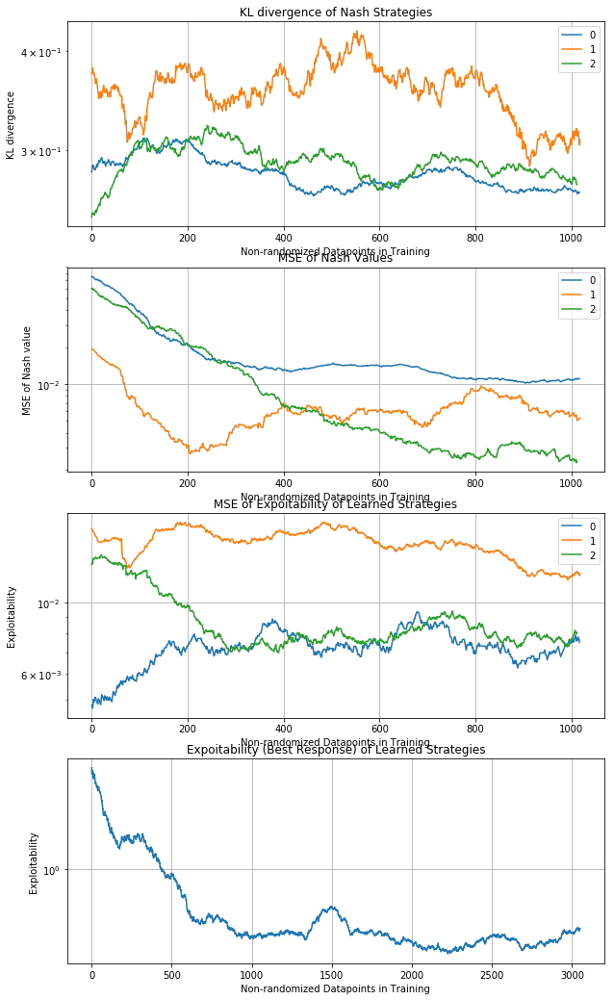

In [27]:
import pickle
def load_obj(path_prefix):
    with open(path_prefix + 'simple_mdp_log_no_target.pkl', 'rb') as f:
        return pickle.load(f)
path_prefix = '../data/nash_dqn_test/nash_dqn_'
data = load_obj(path_prefix)
# print(data)
fig, axs = plt.subplots(4, figsize=(10,18))

kl = data['kl_nash_dist']
for i, kl4trans in enumerate(kl):
    axs[0].plot(smooth(np.array(kl4trans)), label=i)
axs[0].set_xlabel('Non-randomized Datapoints in Training')
axs[0].set_ylabel('KL divergence')
axs[0].set_yscale('log')
axs[0].legend()
axs[0].grid()
axs[0].set_title('KL divergence of Nash Strategies')
# axs[0].savefig(path_prefix+'kl_dist.pdf')

mse = data['mse_nash_v']
for i, mse4trans in enumerate(mse):
    axs[1].plot(smooth(np.array(mse4trans)), label=i)
axs[1].set_xlabel('Non-randomized Datapoints in Training')
axs[1].set_ylabel('MSE of Nash value')
axs[1].set_yscale('log')
axs[1].legend()
axs[1].grid()
axs[1].set_title('MSE of Nash Values')
# axs[1].savefig(path_prefix+'mse_v.pdf')

exp = data['mse_exploitability']
for i, exp4trans in enumerate(exp):
    axs[2].plot(smooth(np.array(exp4trans)), label=i)
axs[2].set_xlabel('Non-randomized Datapoints in Training')
axs[2].set_ylabel('Exploitability')
axs[2].set_yscale('log')
axs[2].legend()
axs[2].grid()
axs[2].set_title('MSE of Expoitability of Learned Strategies')
# axs[2].savefig(path_prefix+'exp.pdf')

brv = data['brv']
print(brv[-10:])
axs[3].plot(smooth(np.array(brv)), label=i)
axs[3].set_xlabel('Non-randomized Datapoints in Training')
axs[3].set_ylabel('Exploitability')
axs[3].set_yscale('log')
axs[3].grid()
axs[3].set_title('Expoitability (Best Response) of Learned Strategies')
# axs[2].savefig(pat

plt.savefig(path_prefix+'test.pdf')

print(data['state_visit'])

{0: 7632, 1: 7391, 2: 7451, 3: 6591, 4: 6746, 5: 8857, 6: 10181, 7: 5197, 8: 6984}


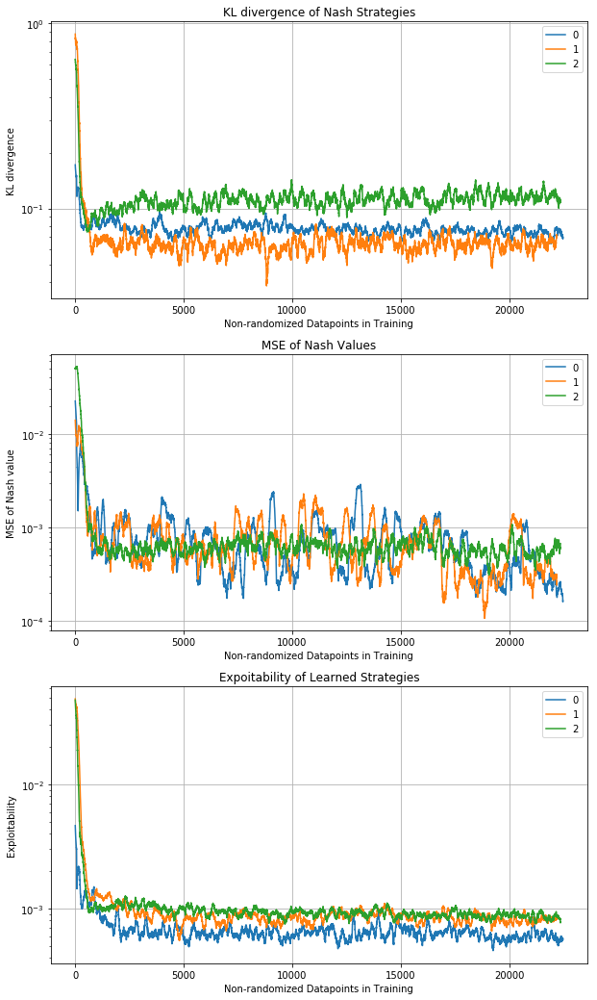

In [22]:
# MWU itr 1000

import pickle
def load_obj(path_prefix):
    with open(path_prefix + 'simple_mdp_log1000.pkl', 'rb') as f:
        return pickle.load(f)
path_prefix = '../data/nash_dqn_test/nash_dqn_'
data = load_obj(path_prefix)
# print(data)
fig, axs = plt.subplots(3, figsize=(10,18))

kl = data['kl_nash_dist']
for i, kl4trans in enumerate(kl):
    axs[0].plot(smooth(np.array(kl4trans)), label=i)
axs[0].set_xlabel('Non-randomized Datapoints in Training')
axs[0].set_ylabel('KL divergence')
axs[0].set_yscale('log')
axs[0].legend()
axs[0].grid()
axs[0].set_title('KL divergence of Nash Strategies')
# axs[0].savefig(path_prefix+'kl_dist.pdf')

mse = data['mse_nash_v']
for i, mse4trans in enumerate(mse):
    axs[1].plot(smooth(np.array(mse4trans)), label=i)
axs[1].set_xlabel('Non-randomized Datapoints in Training')
axs[1].set_ylabel('MSE of Nash value')
axs[1].set_yscale('log')
axs[1].legend()
axs[1].grid()
axs[1].set_title('MSE of Nash Values')
# axs[1].savefig(path_prefix+'mse_v.pdf')

exp = data['mse_exploitability']
for i, exp4trans in enumerate(exp):
    axs[2].plot(smooth(np.array(exp4trans)), label=i)
axs[2].set_xlabel('Non-randomized Datapoints in Training')
axs[2].set_ylabel('Exploitability')
axs[2].set_yscale('log')
axs[2].legend()
axs[2].grid()
axs[2].set_title('Expoitability of Learned Strategies')
# axs[2].savefig(path_prefix+'exp.pdf')

plt.savefig(path_prefix+'test.pdf')

print(data['state_visit'])

In [1]:
# ECOS

import pickle
def load_obj(path_prefix):
    with open(path_prefix + 'simple_mdp_log_ecos.pkl', 'rb') as f:
        return pickle.load(f)
path_prefix = '../data/nash_dqn_test/nash_dqn_'
data = load_obj(path_prefix)
# print(data)
fig, axs = plt.subplots(3, figsize=(10,18))

kl = data['kl_nash_dist']
for i, kl4trans in enumerate(kl):
    axs[0].plot(smooth(np.array(kl4trans)), label=i)
axs[0].set_xlabel('Non-randomized Datapoints in Training')
axs[0].set_ylabel('KL divergence')
axs[0].set_yscale('log')
axs[0].legend()
axs[0].grid()
axs[0].set_title('KL divergence of Nash Strategies')
# axs[0].savefig(path_prefix+'kl_dist.pdf')

mse = data['mse_nash_v']
for i, mse4trans in enumerate(mse):
    axs[1].plot(smooth(np.array(mse4trans)), label=i)
axs[1].set_xlabel('Non-randomized Datapoints in Training')
axs[1].set_ylabel('MSE of Nash value')
axs[1].set_yscale('log')
axs[1].legend()
axs[1].grid()
axs[1].set_title('MSE of Nash Values')
# axs[1].savefig(path_prefix+'mse_v.pdf')

exp = data['mse_exploitability']
for i, exp4trans in enumerate(exp):
    axs[2].plot(smooth(np.array(exp4trans)), label=i)
axs[2].set_xlabel('Non-randomized Datapoints in Training')
axs[2].set_ylabel('Exploitability')
axs[2].set_yscale('log')
axs[2].legend()
axs[2].grid()
axs[2].set_title('Expoitability of Learned Strategies')
# axs[2].savefig(path_prefix+'exp.pdf')

plt.savefig(path_prefix+'test.pdf')

print(data['state_visit'])

NameError: name 'plt' is not defined

## Nash DQN with Exploiter Results

In [1]:
import pickle
def load_obj(path_prefix):
    with open(path_prefix + 'simple_mdp_log.pkl', 'rb') as f:
        return pickle.load(f)
path_prefix = '../data/nash_dqn_test/nash_dqn_exploiter_'
data = load_obj(path_prefix)
# print(data)
fig, axs = plt.subplots(3, figsize=(10,18))

kl = data['kl_nash_dist']
for i, kl4trans in enumerate(kl):
    axs[0].plot(smooth(np.array(kl4trans)), label=i)
axs[0].set_xlabel('Non-randomized Datapoints in Training')
axs[0].set_ylabel('KL divergence')
axs[0].set_yscale('log')
axs[0].legend()
axs[0].grid()
axs[0].set_title('KL divergence of Nash Strategies')
# axs[0].savefig(path_prefix+'kl_dist.pdf')

mse = data['mse_nash_v']
for i, mse4trans in enumerate(mse):
    axs[1].plot(smooth(np.array(mse4trans)), label=i)
axs[1].set_xlabel('Non-randomized Datapoints in Training')
axs[1].set_ylabel('MSE of Nash value')
axs[1].set_yscale('log')
axs[1].legend()
axs[1].grid()
axs[1].set_title('MSE of Nash Values')
# axs[1].savefig(path_prefix+'mse_v.pdf')


exp = data['mse_exploitability']
for i, exp4trans in enumerate(exp):
    axs[2].plot(smooth(np.array(exp4trans)), label=i)
axs[2].set_xlabel('Non-randomized Datapoints in Training')
axs[2].set_ylabel('Exploitability')
axs[2].set_yscale('log')
axs[2].legend()
axs[2].grid()
axs[2].set_title('Expoitability of Learned Strategies')
# axs[2].savefig(path_prefix+'exp.pdf')

plt.savefig(path_prefix+'test.pdf')

print(data['state_visit'])

FileNotFoundError: [Errno 2] No such file or directory: 'data/nash_dqn_exploiter_simple_mdp_log.pkl'

In [187]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

import random
# torch.manual_seed(1)    # reproducible
raw_x = np.ones(100).astype(np.float32)
raw_y = np.concatenate([np.ones(50), np.zeros(50)]).astype(np.float32)

# x = torch.tensor(np.ones(100).astype(np.float32)).unsqueeze(-1) # x data (tensor), shape=(100, 1)
# y = torch.tensor(np.concatenate([np.ones(50), np.zeros(50)]).astype(np.float32) ).unsqueeze(-1)             # noisy y data (tensor), shape=(100, 1)
# print(x.shape, y.shape)
n=20
# torch can only train on Variable, so convert them to Variable
# The code below is deprecated in Pytorch 0.4. Now, autograd directly supports tensors
# x, y = Variable(x), Variable(y)

# plt.scatter(x.data.numpy(), y.data.numpy())
# plt.show()

test_results = []
test_itr = 10

class Net(torch.nn.Module):
    def __init__(self, n_feature, n_hidden, n_output):
        super(Net, self).__init__()
        self.hidden = torch.nn.Linear(n_feature, n_hidden)   # hidden layer
        self.predict = torch.nn.Linear(n_hidden, n_output)   # output layer

    def forward(self, x):
        x = F.relu(self.hidden(x))      # activation function for hidden layer
        x = self.predict(x)             # linear output
        return x

net = Net(n_feature=1, n_hidden=10, n_output=1)     # define the network
print(net)  # net architecture

optimizer = torch.optim.SGD(net.parameters(), lr=0.02)
loss_func = torch.nn.MSELoss()  # this is for regression mean squared loss

# plt.ion()   # something about plotting
for _ in range(test_itr):
    for t in range(10000):
        x =  torch.tensor(random.sample(list(raw_x), n)).unsqueeze(-1)
        y =  torch.tensor(random.sample(list(raw_y), n)).unsqueeze(-1)

        for _ in range(10):
            prediction = net(x)     # input x and predict based on x

            loss = loss_func(prediction, y)     # must be (1. nn output, 2. target)

            optimizer.zero_grad()   # clear gradients for next train
            loss.backward()         # backpropagation, compute gradients
            optimizer.step()        # apply gradients
        print(loss)
    prediction = net(x)
    print(prediction[0])
    test_results.append(prediction[0].detach().numpy())
#     if t % 5 == 0:
#         # plot and show learning process
#         plt.cla()
#         plt.scatter(x.data.numpy(), y.data.numpy())
#         plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)
#         plt.text(0.5, 0, 'Loss=%.4f' % loss.data.numpy(), fontdict={'size': 20, 'color':  'red'})
#         plt.pause(0.1)

# plt.ioff()
# plt.show()
print(np.mean(test_results), np.std(test_results))

Net(
  (hidden): Linear(in_features=1, out_features=10, bias=True)
  (predict): Linear(in_features=10, out_features=1, bias=True)
)
tensor(0.2483, grad_fn=<MseLossBackward>)
tensor(0.2475, grad_fn=<MseLossBackward>)
tensor(0.2277, grad_fn=<MseLossBackward>)
tensor(0.2275, grad_fn=<MseLossBackward>)
tensor(0.2281, grad_fn=<MseLossBackward>)
tensor(0.2280, grad_fn=<MseLossBackward>)
tensor(0.2400, grad_fn=<MseLossBackward>)
tensor(0.2403, grad_fn=<MseLossBackward>)
tensor(0.2500, grad_fn=<MseLossBackward>)
tensor(0.2475, grad_fn=<MseLossBackward>)
tensor(0.2500, grad_fn=<MseLossBackward>)
tensor(0.2500, grad_fn=<MseLossBackward>)
tensor(0.2401, grad_fn=<MseLossBackward>)
tensor(0.2501, grad_fn=<MseLossBackward>)
tensor(0.2475, grad_fn=<MseLossBackward>)
tensor(0.2400, grad_fn=<MseLossBackward>)
tensor(0.2476, grad_fn=<MseLossBackward>)
tensor(0.2400, grad_fn=<MseLossBackward>)
tensor(0.2476, grad_fn=<MseLossBackward>)
tensor(0.2500, grad_fn=<MseLossBackward>)
tensor(0.2401, grad_fn=<MseL

In [41]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

import random
# torch.manual_seed(1)    # reproducible
raw_x = np.ones(100).astype(np.float32)
raw_y = np.concatenate([np.ones(50), np.zeros(50)]).astype(np.float32)

# x = torch.tensor(np.ones(100).astype(np.float32)).unsqueeze(-1) # x data (tensor), shape=(100, 1)
# y = torch.tensor(np.concatenate([np.ones(50), np.zeros(50)]).astype(np.float32) ).unsqueeze(-1)             # noisy y data (tensor), shape=(100, 1)
# print(x.shape, y.shape)
n=5
# torch can only train on Variable, so convert them to Variable
# The code below is deprecated in Pytorch 0.4. Now, autograd directly supports tensors
# x, y = Variable(x), Variable(y)

# plt.scatter(x.data.numpy(), y.data.numpy())
# plt.show()

test_results = []
test_itr = 10

class Net(torch.nn.Module):
    def __init__(self, n_feature, n_hidden, n_output):
        super(Net, self).__init__()
        self.hidden1 = torch.nn.Linear(n_feature, n_hidden)   # hidden layer
        self.hidden2 = torch.nn.Linear(n_hidden, n_hidden)
        self.hidden3 = torch.nn.Linear(n_hidden, n_hidden)
        self.predict = torch.nn.Linear(n_hidden, n_output)   # output layer

    def forward(self, x):
        x = F.relu(self.hidden1(x))      # activation function for hidden layer
        x = F.relu(self.hidden2(x)) 
        x = F.relu(self.hidden3(x)) 
        x = self.predict(x)             # linear output
        return x

net = Net(n_feature=1, n_hidden=10, n_output=1)     # define the network
print(net)  # net architecture

optimizer = torch.optim.SGD(net.parameters(), lr=0.0001)
loss_func = torch.nn.MSELoss()  # this is for regression mean squared loss
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.95)

# plt.ion()   # something about plotting
for _ in range(test_itr):
    for t in range(10000):
        x =  torch.tensor(random.sample(list(raw_x), n)).unsqueeze(-1)
        y =  torch.tensor(random.sample(list(raw_y), n)).unsqueeze(-1)
        for _ in range(1):
            prediction = net(x)     # input x and predict based on x

            # loss = loss_func(prediction, y)     # must be (1. nn output, 2. target)
            # loss = F.smooth_l1_loss(prediction, y)
            loss = F.mse_loss(prediction, y)

            optimizer.zero_grad()   # clear gradients for next train
            loss.backward()         # backpropagation, compute gradients
            optimizer.step()        # apply gradients
        # scheduler.step()
        print(loss)
    prediction = net(x)
    print(prediction[0])
    test_results.append(prediction[0].detach().numpy())
#     if t % 5 == 0:
#         # plot and show learning process
#         plt.cla()
#         plt.scatter(x.data.numpy(), y.data.numpy())
#         plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)
#         plt.text(0.5, 0, 'Loss=%.4f' % loss.data.numpy(), fontdict={'size': 20, 'color':  'red'})
#         plt.pause(0.1)

# plt.ioff()
# plt.show()
print(np.mean(test_results), np.std(test_results))

Net(
  (hidden1): Linear(in_features=1, out_features=10, bias=True)
  (hidden2): Linear(in_features=10, out_features=10, bias=True)
  (hidden3): Linear(in_features=10, out_features=10, bias=True)
  (predict): Linear(in_features=10, out_features=1, bias=True)
)
tensor(0.4941, grad_fn=<MeanBackward0>)
tensor(0.3324, grad_fn=<MeanBackward0>)
tensor(0.4939, grad_fn=<MeanBackward0>)
tensor(0.3322, grad_fn=<MeanBackward0>)
tensor(0.4936, grad_fn=<MeanBackward0>)
tensor(0.4934, grad_fn=<MeanBackward0>)
tensor(0.3319, grad_fn=<MeanBackward0>)
tensor(0.3319, grad_fn=<MeanBackward0>)
tensor(0.1706, grad_fn=<MeanBackward0>)
tensor(0.1706, grad_fn=<MeanBackward0>)
tensor(0.4930, grad_fn=<MeanBackward0>)
tensor(0.6539, grad_fn=<MeanBackward0>)
tensor(0.4925, grad_fn=<MeanBackward0>)
tensor(0.4924, grad_fn=<MeanBackward0>)
tensor(0.3313, grad_fn=<MeanBackward0>)
tensor(0.4921, grad_fn=<MeanBackward0>)
tensor(0.4919, grad_fn=<MeanBackward0>)
tensor(0.6525, grad_fn=<MeanBackward0>)
tensor(0.4915, grad

In [13]:
import numpy as np 
a=[1,2,0]
np.nonzero()

None
